# Visualizing V(D)J data

## Integration with `scanpy`
Now that we have both 1) a pre-processed V(D)J data in `DandelionPolars` object and 2) matching `AnnData` object, we can start finding clones and *'integrate'* the results. All the V(D)J (AIRR) analyses files can be saved as *.tsv* format so that it can be used in other tools like *immcantation*, *immunoarch*, *vdjtools*, etc.

The results can also be ported into the `AnnData` object for access to more plotting functions provided through `scanpy` [[Wolf2018]](https://doi.org/10.1186/s13059-017-1382-0).

In [1]:
import os
import scanpy as sc
import pandas as pd
import dandelion as ddl

sc.settings.verbosity = 3

# change to tutorials directory
os.chdir("dandelion_tutorial")

### Read in the previously saved files

I will work with the same example from the previous section since I have the `AnnData` object saved and vdj table filtered.

In [2]:
adata = sc.read_h5ad("adata.h5ad")
adata

AnnData object with n_obs × n_vars = 25063 × 1309
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'gmm_pct_count_clusters_keep', 'scrublet_score', 'is_doublet', 'filter_rna', 'has_contig', 'productive_VDJ', 'productive_VJ', 'd_call_VDJ', 'j_call_VDJ', 'j_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'locus_VDJ', 'locus_VJ', 'v_call_VDJ', 'v_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'umi_count_VDJ', 'umi_count_VJ', 'productive_VDJ_main', 'productive_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'junction_VDJ_main', 'junction_VJ_main', 'junction_aa_VDJ_main', 'junction_aa_VJ_main', 'locus_VDJ_main', 'locus_VJ_main', 'v_call_genotyped_VDJ_main', 'v_call_genotyped_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'umi_count_VDJ_main', 'umi_count_VJ_main', 'isotype', 'isotype_main', 'isotype_status', 'locus_status', 'chain_status', 'rearrangement_status_VDJ', 'rearrangement_status_VJ', 'lei

In [3]:
vdj = ddl.read_zipddl("dandelion_results_simplified.zipddl")
vdj

Lazy Dandelion object with n_obs = 2353 and n_contigs = 5625
    data: sequence_id, sequence, rev_comp, productive, v_call, d_call, j_call, sequence_alignment, germline_alignment, junction, junction_aa, v_cigar, d_cigar, j_cigar, stop_codon, vj_in_frame, locus, junction_length, np1_length, np2_length, v_sequence_start, v_sequence_end, v_germline_start, v_germline_end, d_sequence_start, d_sequence_end, d_germline_start, d_germline_end, j_sequence_start, j_sequence_end, j_germline_start, j_germline_end, v_score, v_identity, v_support, d_score, d_identity, d_support, j_score, j_identity, j_support, fwr1, fwr2, fwr3, fwr4, cdr1, cdr2, cdr3, cell_id, consensus_count, umi_count, v_call_10x, d_call_10x, j_call_10x, junction_10x, junction_10x_aa, j_call_blastn, j_identity_blastn, j_alignment_length_blastn, j_number_of_mismatches_blastn, j_number_of_gap_openings_blastn, j_sequence_start_blastn, j_sequence_end_blastn, j_germline_start_blastn, j_germline_end_blastn, j_support_blastn, j_score_blas

### `ddl.tl.transfer`

We can sync the V(D)J data from `DandelionPolars` object to the matching `AnnData` object using `ddl.tl.transfer` function.

In [4]:
ddl.tl.transfer(adata, vdj)
adata

Transferring network
 finished: updated `.obs` with `.metadata`
wrote active layout to `.obsm['X_vdj']`; stashed all views in `.uns['dandelion']` ('X_vdj_all', 'X_vdj_expanded')
wrote `.obsp['connectivities']` & `['distances']` from graph[0]
stashed GEX matrices in `.uns['dandelion']` ('gex_connectivities', 'gex_distances')
stashed VDJ matrices in `.uns['dandelion']` under 'vdj_connectivities_all' / '_expanded'
added `.uns['clone_id']` clone-level mapping (0:00:00)


AnnData object with n_obs × n_vars = 25063 × 1309
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'gmm_pct_count_clusters_keep', 'scrublet_score', 'is_doublet', 'filter_rna', 'has_contig', 'productive_VDJ', 'productive_VJ', 'd_call_VDJ', 'j_call_VDJ', 'j_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'junction_aa_VJ', 'locus_VDJ', 'locus_VJ', 'v_call_VDJ', 'v_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'umi_count_VDJ', 'umi_count_VJ', 'productive_VDJ_main', 'productive_VJ_main', 'd_call_VDJ_main', 'j_call_VDJ_main', 'j_call_VJ_main', 'junction_VDJ_main', 'junction_VJ_main', 'junction_aa_VDJ_main', 'junction_aa_VJ_main', 'locus_VDJ_main', 'locus_VJ_main', 'v_call_genotyped_VDJ_main', 'v_call_genotyped_VJ_main', 'c_call_VDJ_main', 'c_call_VJ_main', 'umi_count_VDJ_main', 'umi_count_VJ_main', 'isotype', 'isotype_main', 'isotype_status', 'locus_status', 'chain_status', 'rearrangement_status_VDJ', 'rearrangement_status_VJ', 'lei

<div class="alert alert-info">

Note
    
If a column with the same name between `Dandelion.metadata` and `AnnData.obs` already exists, `tl.transfer` will not overwrite the column in the `AnnData` object. This can be toggled to overwrite all with `overwrite=True` or `overwrite=["column_name1", "column_name2"]` if only some columns are to be overwritten.

</div>

You can see that `AnnData` object now contains a couple more columns in the `.obs` slot, corresponding to the metadata that is returned after `tl.generate_network`, and newly populated `.obsm` and `.obsp` slots. The original RNA connectivities and distances are now added into the `.obsp` slot as well.

## Plotting in `scanpy`

### `pl.clone_network`

So now, basically we can plot in `scanpy` with their plotting modules. I've included a plotting function in <b>dandelion</b>, `pl.clone_network`, which is really just a wrapper of their `pl.embedding` module.

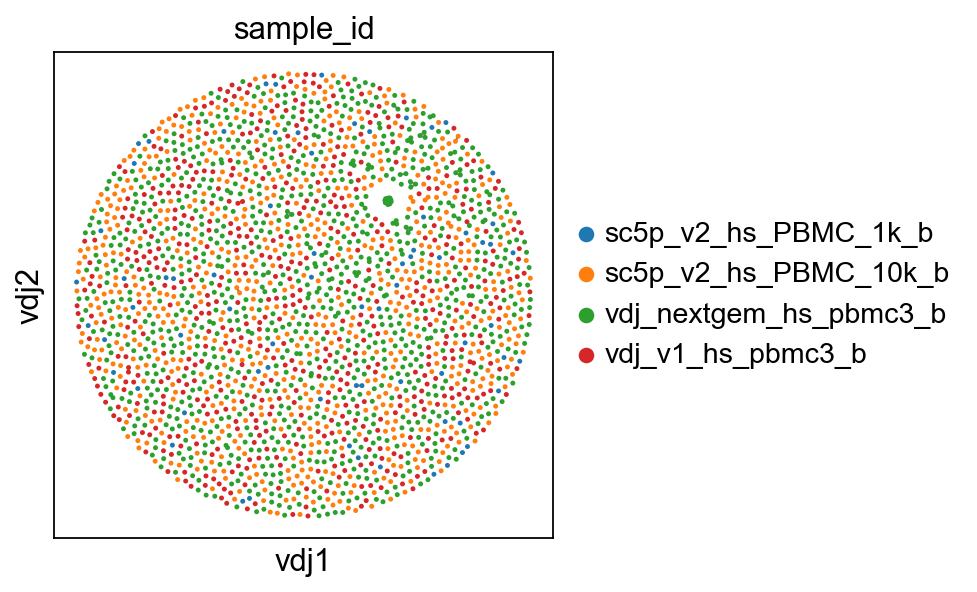

In [5]:
sc.set_figure_params(figsize=[4, 4])
ddl.pl.clone_network(adata, color=["sample_id"], edges_width=1, size=20)

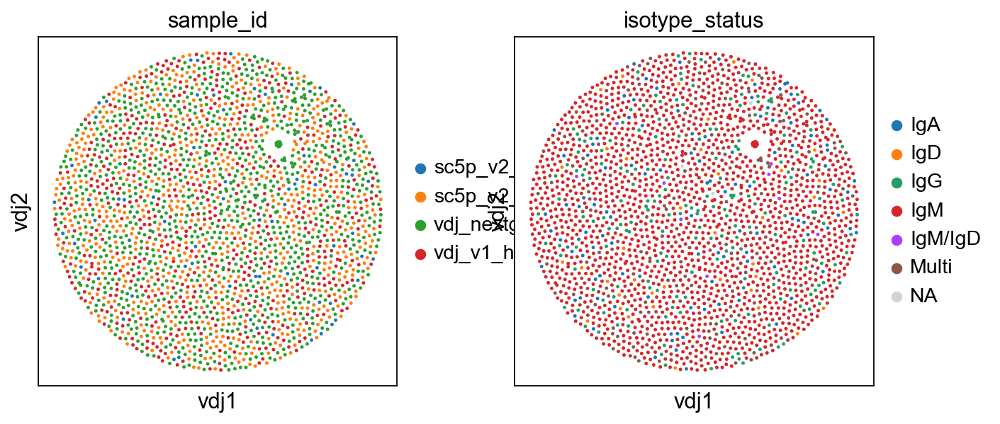

In [6]:
ddl.pl.clone_network(
    adata, color=["sample_id", "isotype_status"], edges_width=1, size=20
)

To show only expanded clones, we swap the view with a new function.

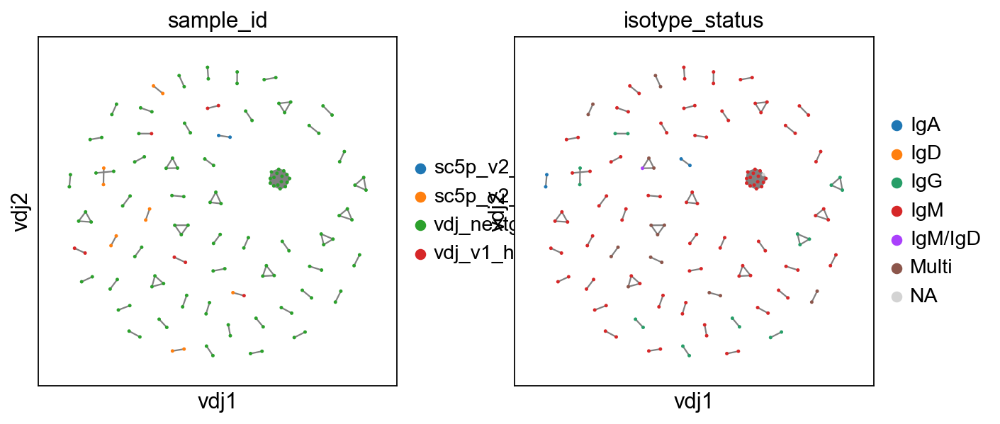

In [7]:
ddl.tl.clone_view(adata, mode="expanded")
ddl.pl.clone_network(
    adata, color=["sample_id", "isotype_status"], edges_width=1, size=20
)

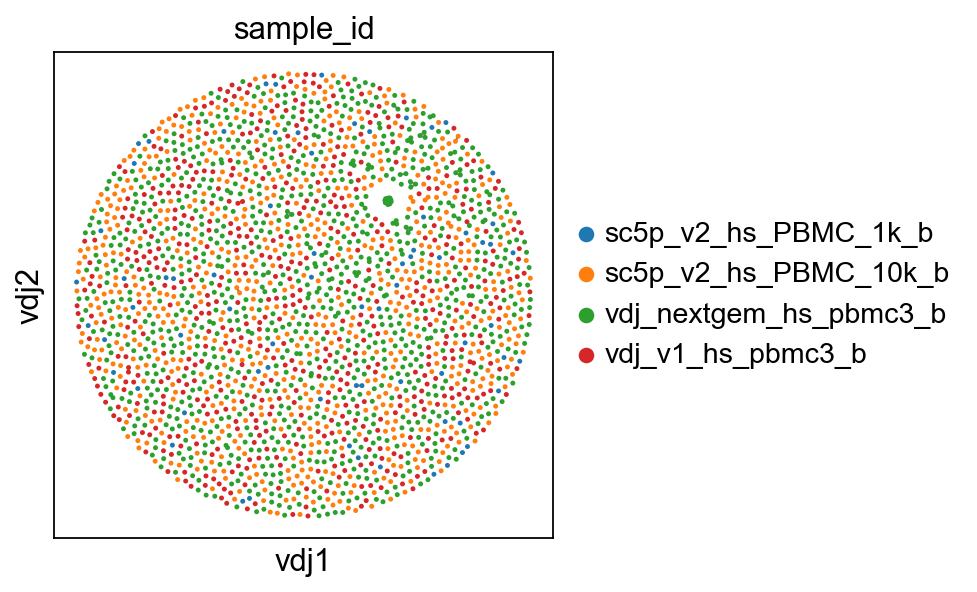

In [8]:
# swap back to "all"
ddl.tl.clone_view(adata, mode="all")
ddl.pl.clone_network(adata, color=["sample_id"], edges_width=1, size=20)

The `mode` can also be swap to `rna` to reset the neighborhood graph to the RNA-based one for any downstream analysis. If `mode` is set to `None`, then the user can specify the keys in `.obsp` and `.obsm` to set as active by providing `connectivities_key`, `distances_key`, and `embedding_key`.

You might also be wondering why the plot for the largest clone looks different from the one we plotted in the base version of `dandelion`? In the base version, the clone had an additional edge to form a little sub-cluster, but in this plot, the clone is just a fully-connnected cluster.

This is because now the graph is based on the distances computed at the `find_clones` step, which uses the CDR3 junction as a default. With the full TCR/BCR sequence, it's possible that there are more differences between the sequences, which results in a larger distance and thus no edge between some of the cells in the clone. Additionally, `find_clones` uses `hamming distance` as the default distance metric, which is different to the default distance metric used in `generate_network` (`levenshtein distance`; which accounts for insertions and deletions). You can change the distance metric used in `find_clones` to `levenshtein` (or even `BLOSUM62`) to see if that results in different results.

For now, to reach a similar plot as the one we plotted in the base version, there are 2 options:

1) Run `find_clones` again but use `key="sequence_alignment_aa"` and potentially change the distance metric to `levenshtein` or `BLOSUM62` to account for the full sequence differences, which will then be reflected in the graph structure in the `generate_network` step when `use_existing_distance=True` (which is the default).
2) or, in the `generate_network` step, use `use_existing_distance=False` to re-compute the distance matrix based on the full sequence alignment (which is the default `key`). 

Let's see how the second option works:

Generating network
Calculating distance matrix  with distance_mode = 'clone'



100%|██████████| 2259/2259 [00:00<00:00, 906518.63it/s]

Distances calculated in 0.04 seconds
Computing network layout



OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Computing expanded network layout
 finished.
   Updated Dandelion object
:    'layout', graph layout
 (0:00:00)
Transferring network
 finished: updated `.obs` with `.metadata`
wrote active layout to `.obsm['X_vdj']`; stashed all views in `.uns['dandelion']` ('X_vdj_all', 'X_vdj_expanded')
wrote `.obsp['connectivities']` & `['distances']` from graph[0]
stashed GEX matrices in `.uns['dandelion']` ('gex_connectivities', 'gex_distances')
stashed VDJ matrices in `.uns['dandelion']` under 'vdj_connectivities_all' / '_expanded'
added `.uns['clone_id']` clone-level mapping (0:00:00)


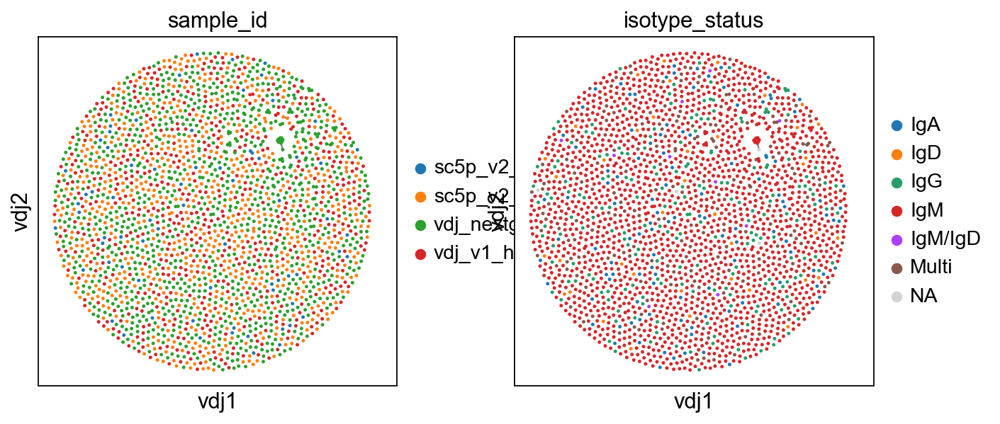

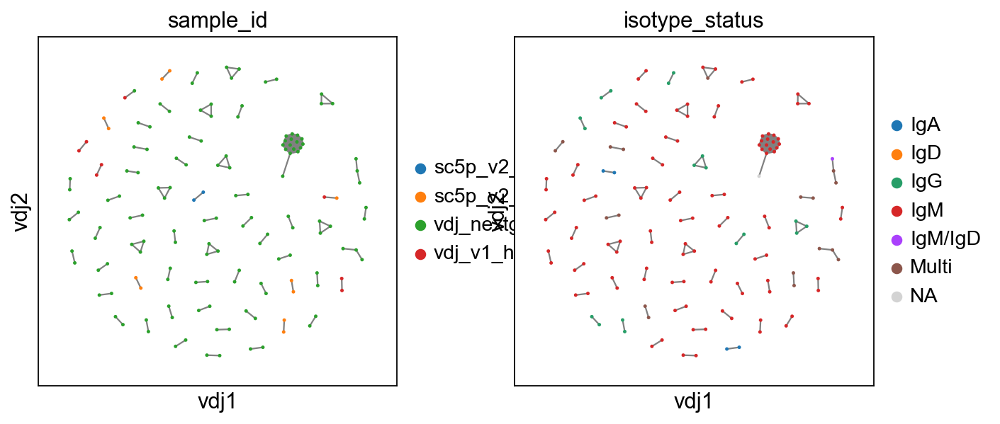

In [9]:
# making a copy of both adata and vdj
vdj2 = vdj.copy()
adata2 = adata.copy()
# recompute layout with original method
ddl.tl.generate_network(
    vdj2, use_existing_distance=False, use_existing_graph=False
)
ddl.tl.transfer(adata2, vdj2)
# visualise
ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)
# swap to expanded mode.
ddl.tl.clone_view(adata2, mode="expanded")
# show where clones/clonotypes have more than 1 cell
ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)

<div class="alert alert-info">

Note

If you want a faster way to compute the layout for large graphs, you might want to try the `mod_fr_bh` layout method. Unlike the default `mod_fr2` which uses a Numba-accelerated modified Fruchterman-Reingold algorithm, `mod_fr_bh` uses a Barnes-Hut approximation with O(N log N) complexity, making it more scalable for large datasets.

</div>

Generating network layout from pre-computed network
Computing network layout (Barnes-Hut CPU)
Computing expanded network layout (Barnes-Hut CPU)
 finished.
   Updated Dandelion object
:    'layout', graph layout
 (0:00:00)
Transferring network
 finished: updated `.obs` with `.metadata`
wrote active layout to `.obsm['X_vdj']`; stashed all views in `.uns['dandelion']` ('X_vdj_all', 'X_vdj_expanded')
wrote `.obsp['connectivities']` & `['distances']` from graph[0]
stashed GEX matrices in `.uns['dandelion']` ('gex_connectivities', 'gex_distances')
stashed VDJ matrices in `.uns['dandelion']` under 'vdj_connectivities_all' / '_expanded'
added `.uns['clone_id']` clone-level mapping (0:00:00)


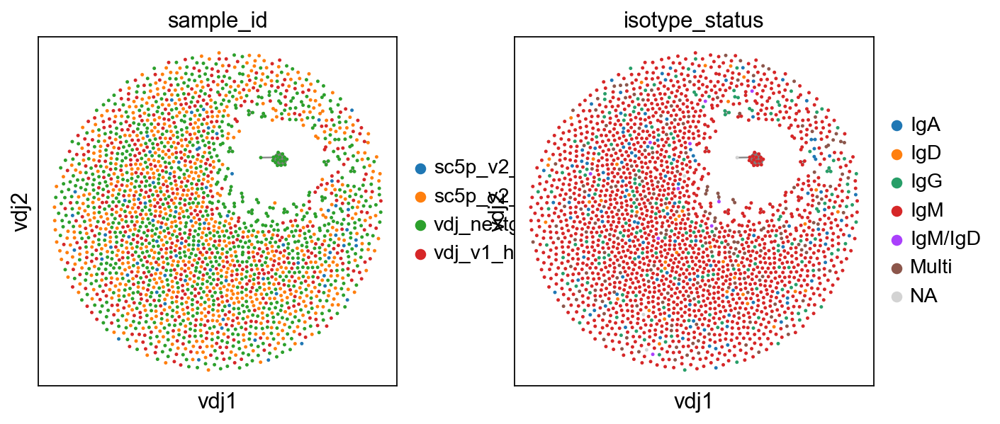

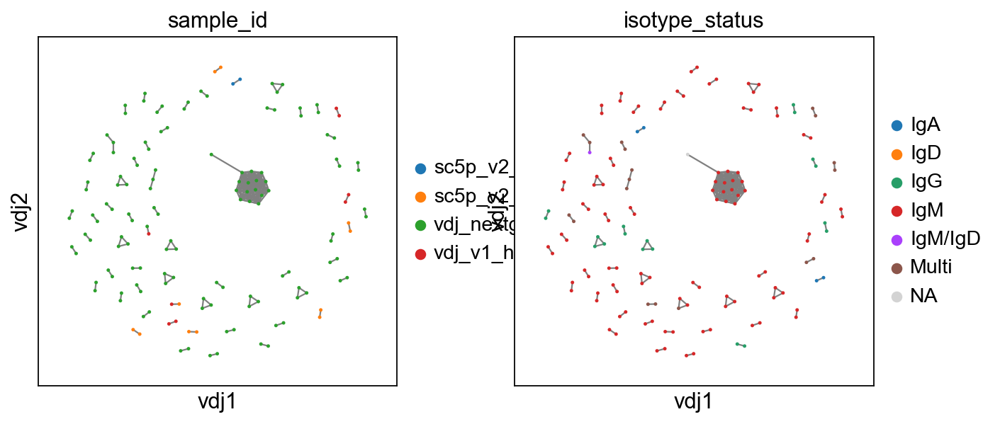

In [10]:
# recompute layout with original method
ddl.tl.generate_network(vdj2, layout_method="mod_fr_bh")
ddl.tl.transfer(adata2, vdj2)
# visualise
ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)
# swap to expanded mode.
ddl.tl.clone_view(adata2, mode="expanded")
# show where clones/clonotypes have more than 1 cell
ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)

### `tl.extract_edge_weights`

We provide an edge weight extractor tool `tl.extract_edge_weights` to retrieve the edge weights that can be used to specify the edge widths according to weight/distance.

Generating network
Using pre-computed distances from .distances

Computing network layout
Computing expanded network layout
 finished.
   Updated Dandelion object
:    'layout', graph layout
 (0:00:00)
Transferring network
 finished: updated `.obs` with `.metadata`
wrote active layout to `.obsm['X_vdj']`; stashed all views in `.uns['dandelion']` ('X_vdj_all', 'X_vdj_expanded')
wrote `.obsp['connectivities']` & `['distances']` from graph[0]
stashed GEX matrices in `.uns['dandelion']` ('gex_connectivities', 'gex_distances')
stashed VDJ matrices in `.uns['dandelion']` under 'vdj_connectivities_all' / '_expanded'
added `.uns['clone_id']` clone-level mapping (0:00:00)


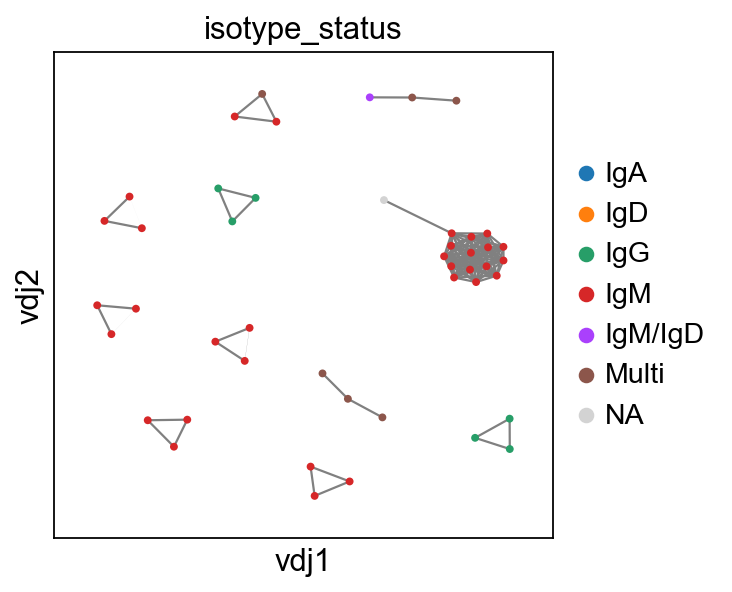

In [11]:
# To illustrate this, first recompute the graph by specifying a minimum size
vdjx = vdj2.copy()
adatax = adata2.copy()
ddl.tl.generate_network(
    vdjx, min_size=3
)  # second graph will only contain clones/clonotypes with >= 3 cells
ddl.tl.transfer(adatax, vdjx)
edgeweights = [
    1 / (e + 1) for e in ddl.tl.extract_edge_weights(vdjx)
]  # invert and add 1 to each edge weight (e) so that distance of 0 becomes the thickest edge.
# therefore, the thicker the line, the shorter the edit distance.
ddl.tl.clone_view(adatax, mode="expanded")
ddl.pl.clone_network(
    adatax,
    color=["isotype_status"],
    legend_fontoutline=3,
    edges_width=edgeweights,
    size=50,
)

`None` here means there is no isotype information i.e. no `c_call`. If `No_contig` appears, it means there's no V(D)J information.

You can interact with `pl.clone_network` just as how you interact with the rest of the scatterplot modules in `scanpy`.

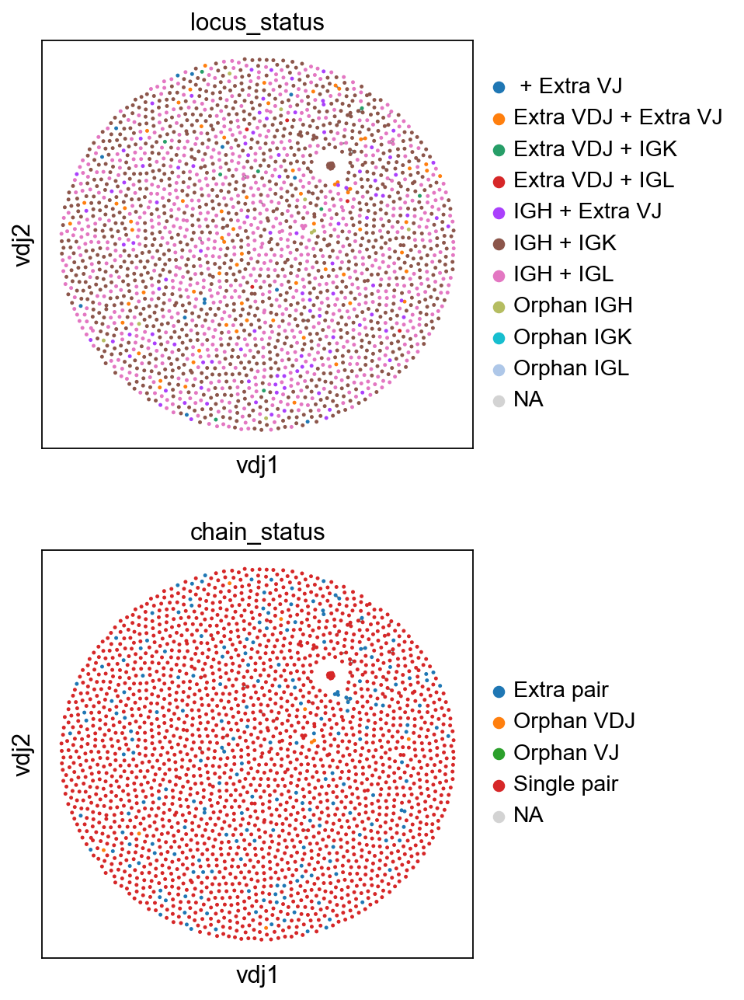

In [12]:
sc.set_figure_params(figsize=[4, 4.5])
ddl.pl.clone_network(
    adata,
    color=["locus_status", "chain_status"],
    ncols=1,
    legend_fontoutline=3,
    edges_width=1,
    size=20,
)

you should be able to save the adata object and interact with it as per normal.

In [13]:
adata.write_h5ad("adata.h5ad", compression="gzip")

## Calculating size of clones

### `ddl.tl.clone_size`

Sometimes it's useful to evaluate the size of the clone. Here `ddl.tl.clone_size` does a simple calculation to enable that. From version 1.0.0 onwards, this function has been refactored and now also returning as proportion and can handle groups. There are new outputs e.g. clone size bins for rare, small, medium etc. similar to scRepertoire!

In [14]:
ddl.tl.clone_size(vdj)
vdj.metadata[
    ["clone_id_size", "clone_id_size_prop", "clone_id_size_category"]
].collect()

clone_id_size,clone_id_size_prop,clone_id_size_category
f64,f64,str
1.0,0.000425,"""Small"""
1.0,0.000425,"""Small"""
1.0,0.000425,"""Small"""
1.0,0.000425,"""Small"""
1.0,0.000425,"""Small"""
…,…,…
1.0,0.000425,"""Small"""
1.0,0.000425,"""Small"""
1.0,0.000425,"""Small"""


In [15]:
vdj.metadata.collect()["clone_id_size_category"].value_counts()

clone_id_size_category,count
str,u32
null,8
"""Small""",2299
"""Medium""",46


You can also compute the clone size within groups by providing the `group_by` argument.

In [16]:
ddl.tl.clone_size(vdj, group_by="isotype_status")

In [17]:
import pandas as pd

pd.crosstab(
    vdj.metadata.collect()["isotype_status"],
    vdj.metadata.collect()["clone_id_size_category"],
).apply(lambda r: r / r.sum() * 100, axis=1)

col_0,Large,Medium,Small
row_0,,,
IgA,3.478261,96.521739,0.000000
IgD,100.000000,0.000000,0.000000
IgG,9.183673,90.816327,0.000000
IgM,0.000000,5.875831,94.124169
IgM/IgD,100.000000,0.000000,0.000000
Multi,9.604520,90.395480,0.000000


In [18]:
ddl.tl.transfer(adata, vdj)

Transferring network
 finished: updated `.obs` with `.metadata`
wrote active layout to `.obsm['X_vdj']`; stashed all views in `.uns['dandelion']` ('X_vdj_all', 'X_vdj_expanded')
wrote `.obsp['connectivities']` & `['distances']` from graph[0]
stashed GEX matrices in `.uns['dandelion']` ('gex_connectivities', 'gex_distances')
stashed VDJ matrices in `.uns['dandelion']` under 'vdj_connectivities_all' / '_expanded'
added `.uns['clone_id']` clone-level mapping (0:00:00)


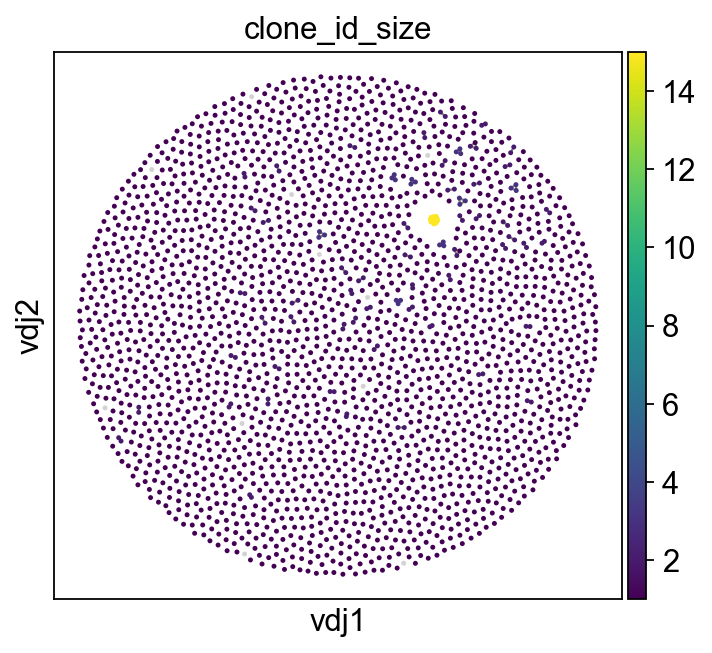

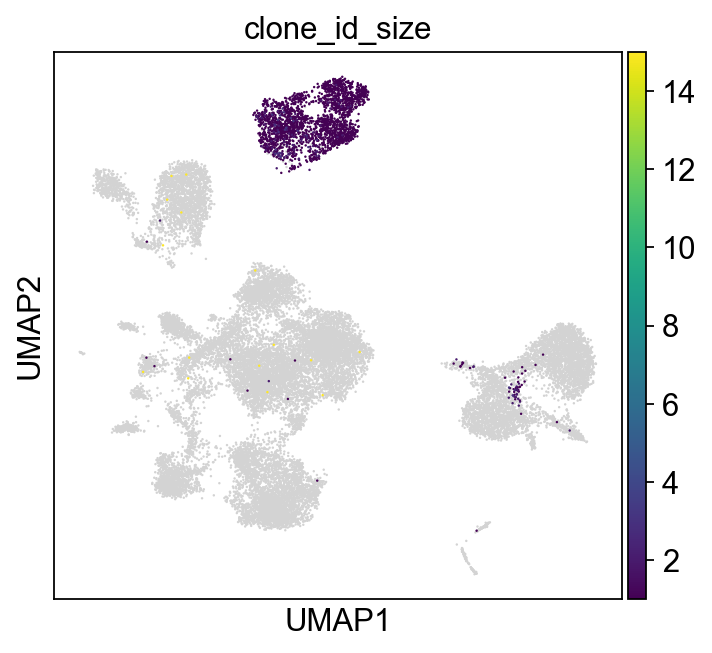

In [19]:
sc.set_figure_params(figsize=[5, 4.5])
ddl.pl.clone_network(
    adata,
    color=["clone_id_size"],
    legend_fontoutline=3,
    edges_width=1,
    size=20,
    color_map="viridis",
)
sc.pl.umap(adata, color=["clone_id_size"], color_map="viridis")

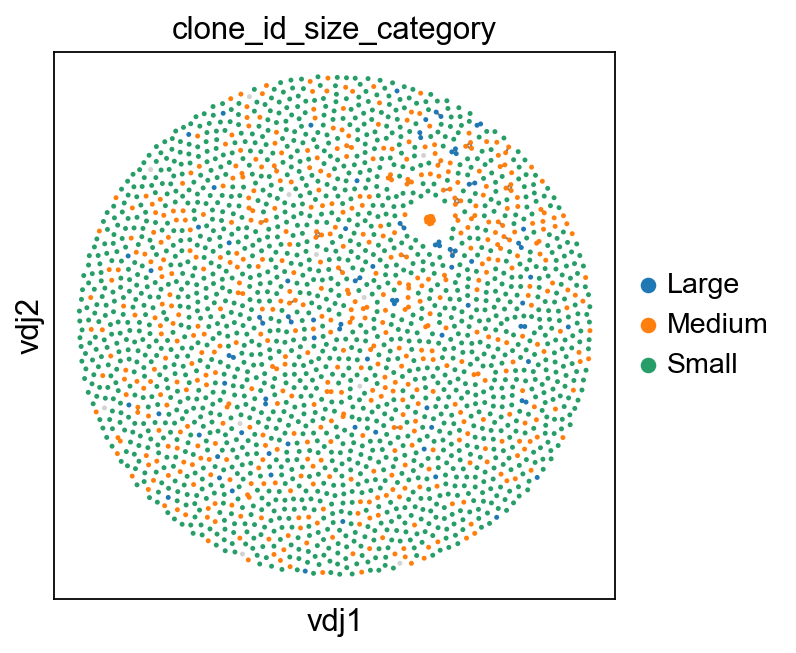

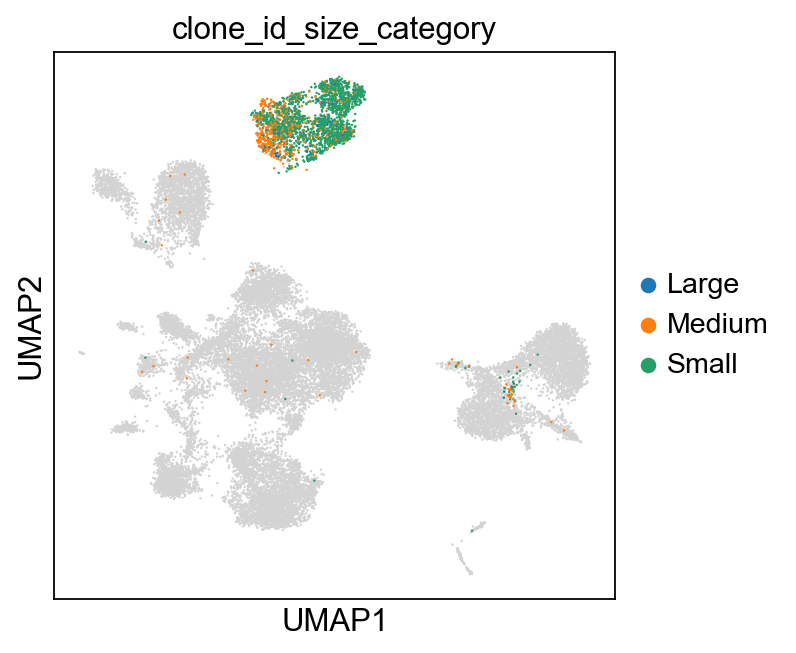

In [20]:
sc.set_figure_params(figsize=[4.5, 4.5])
ddl.pl.clone_network(
    adata,
    color=["clone_id_size_category"],
    legend_fontoutline=3,
    edges_width=1,
    size=20,
    groups=["Small", "Medium", "Large", "Hyperexpanded"],
    na_in_legend=False,
)
sc.pl.umap(
    adata,
    color=["clone_id_size_category"],
    groups=["Small", "Medium", "Large", "Hyperexpanded"],
    na_in_legend=False,
)

You can also specify `max_size` to clip off the calculation at a fixed value.

In [21]:
ddl.tl.clone_size(vdj, max_size=3)
ddl.tl.transfer(adata, vdj)

Transferring network
 finished: updated `.obs` with `.metadata`
wrote active layout to `.obsm['X_vdj']`; stashed all views in `.uns['dandelion']` ('X_vdj_all', 'X_vdj_expanded')
wrote `.obsp['connectivities']` & `['distances']` from graph[0]
stashed GEX matrices in `.uns['dandelion']` ('gex_connectivities', 'gex_distances')
stashed VDJ matrices in `.uns['dandelion']` under 'vdj_connectivities_all' / '_expanded'
added `.uns['clone_id']` clone-level mapping (0:00:00)


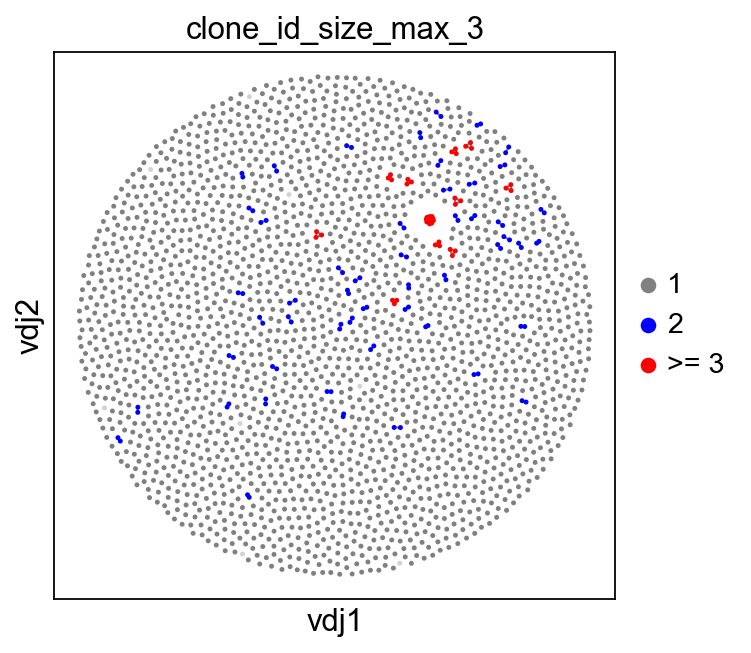

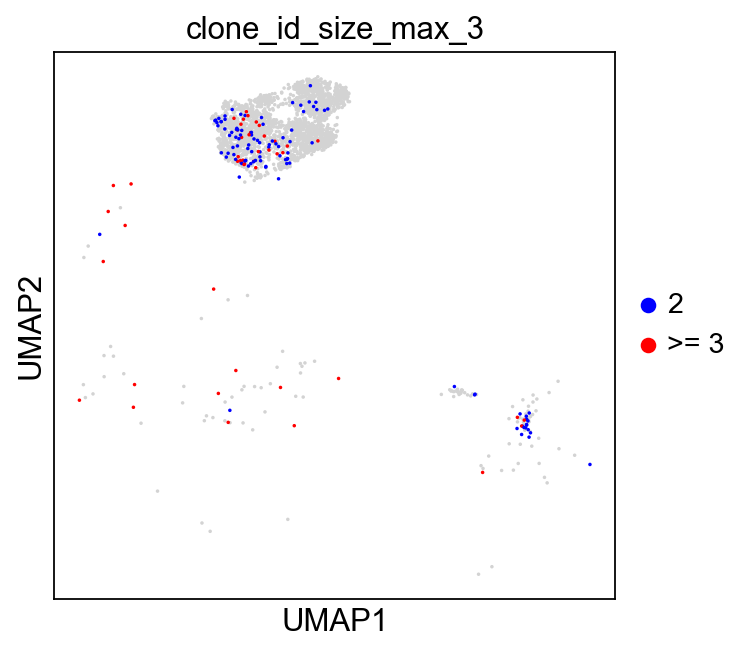

In [22]:
sc.set_figure_params(figsize=[4.5, 4.5])
ddl.pl.clone_network(
    adata,
    color=["clone_id_size_max_3"],
    ncols=2,
    legend_fontoutline=3,
    edges_width=1,
    palette=["grey", "blue", "red"],
    size=20,
    na_in_legend=False,
)
sc.pl.umap(
    adata[adata.obs["has_contig"] == "True"],
    color=["clone_id_size_max_3"],
    groups=["2", ">= 3"],
    size=10,
    na_in_legend=False,
)

## Additional plotting functions

### `ddl.pl.barplot`
`pl.barplot` is a generic barplot function that will plot items in the metadata slot as a bar plot. This function will also interact with `.obs` slot if a `scanpy` object is used in place of `DandelionPolars` object. However, if your `scanpy` object holds a lot of non-B cells, then the plotting will be just be saturated with nan values.

Let's first slice the `DandelionPolars` object to only include cells with at most one heavy chain.

In [23]:
vdj_subset = vdj[
    vdj.metadata["chain_status"].is_in(["Single pair", "Orphan VDJ"])
]
vdj_subset

Lazy Dandelion object with n_obs = 2158 and n_contigs = 4921
    data: sequence_id, sequence, rev_comp, productive, v_call, d_call, j_call, sequence_alignment, germline_alignment, junction, junction_aa, v_cigar, d_cigar, j_cigar, stop_codon, vj_in_frame, locus, junction_length, np1_length, np2_length, v_sequence_start, v_sequence_end, v_germline_start, v_germline_end, d_sequence_start, d_sequence_end, d_germline_start, d_germline_end, j_sequence_start, j_sequence_end, j_germline_start, j_germline_end, v_score, v_identity, v_support, d_score, d_identity, d_support, j_score, j_identity, j_support, fwr1, fwr2, fwr3, fwr4, cdr1, cdr2, cdr3, cell_id, consensus_count, umi_count, v_call_10x, d_call_10x, j_call_10x, junction_10x, junction_10x_aa, j_call_blastn, j_identity_blastn, j_alignment_length_blastn, j_number_of_mismatches_blastn, j_number_of_gap_openings_blastn, j_sequence_start_blastn, j_sequence_end_blastn, j_germline_start_blastn, j_germline_end_blastn, j_support_blastn, j_score_blas

/Users/uqztuong/Documents/GitHub/dandelion/src/dandelion/polars/plotting/_plotting.py:153: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



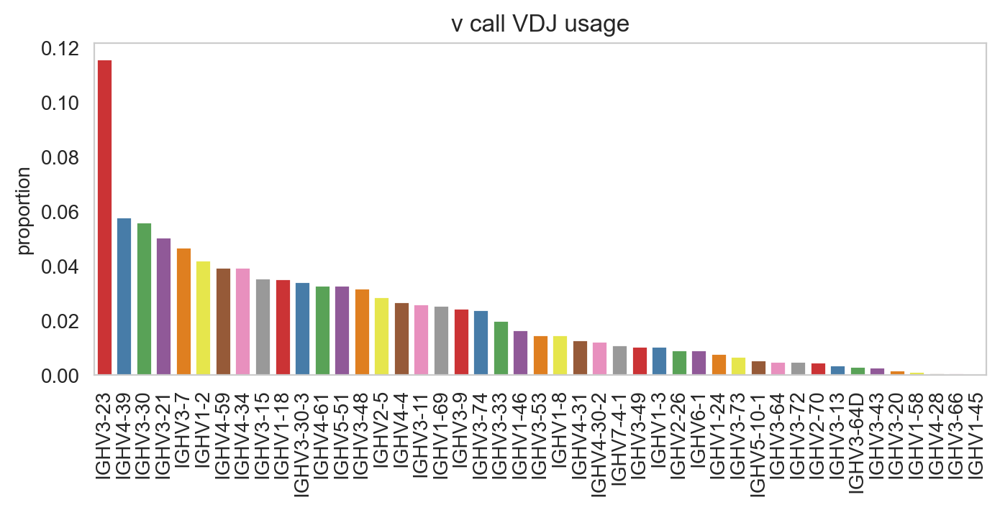

In [24]:
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams.update(mpl.rcParamsDefault)

ddl.pl.barplot(
    vdj_subset,
    color="v_call_VDJ",
)
plt.show()

You can prevent it from sorting by specifying `sort_descending = None`. Colours can be changed with `palette` option.

/Users/uqztuong/Documents/GitHub/dandelion/src/dandelion/polars/plotting/_plotting.py:153: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



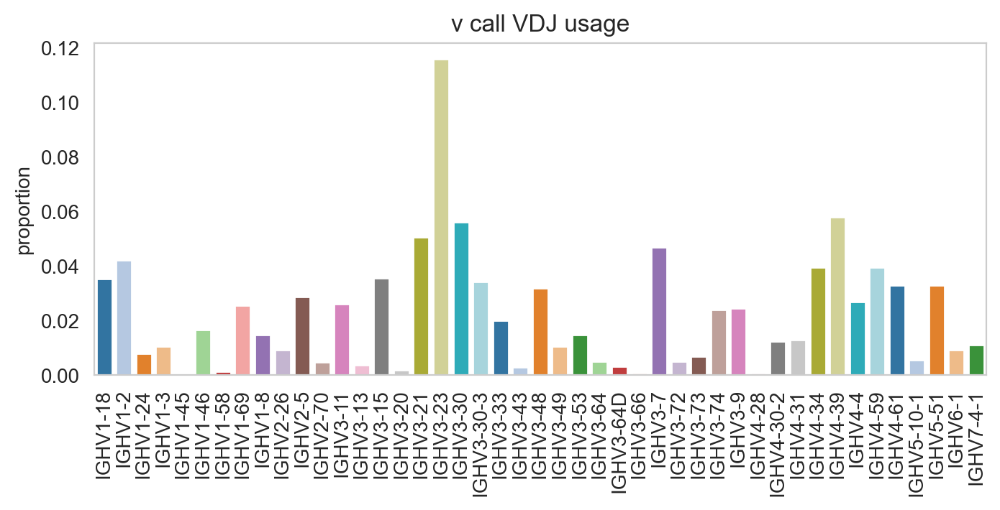

In [25]:
ddl.pl.barplot(
    vdj_subset,
    color="v_call_VDJ",
    sort_descending=None,
    palette="tab20",
)
plt.show()

Specifying `normalize = False` will change the y-axis to counts.

/Users/uqztuong/Documents/GitHub/dandelion/src/dandelion/polars/plotting/_plotting.py:153: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



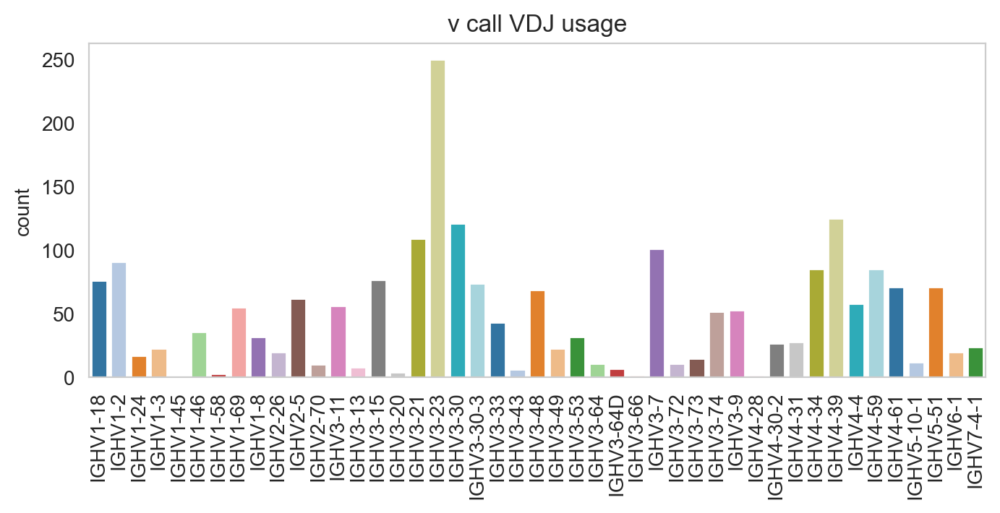

In [26]:
ddl.pl.barplot(
    vdj_subset,
    color="v_call_VDJ",
    normalize=False,
    sort_descending=None,
    palette="tab20",
)
plt.show()

### `pl.stackedbarplot`
`pl.stackedbarplot` is similar to above but can split between specified groups. Some examples below:

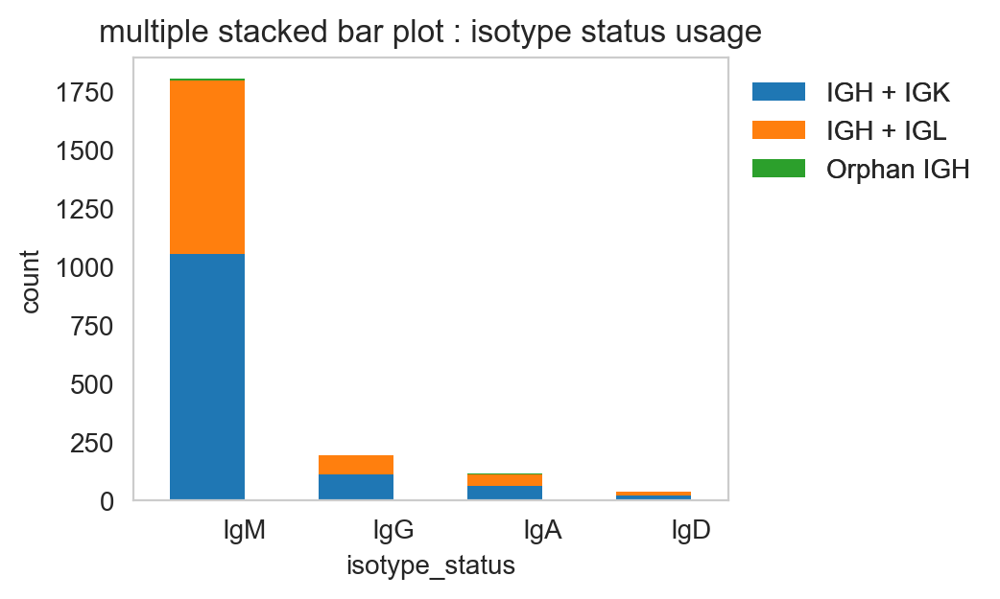

In [27]:
ddl.pl.stackedbarplot(
    vdj_subset,
    color="isotype_status",
    group_by="locus_status",
    xtick_rotation=0,
    figsize=(4, 3),
)
plt.legend(bbox_to_anchor=(1, 1), loc="upper left", frameon=False)
plt.show()

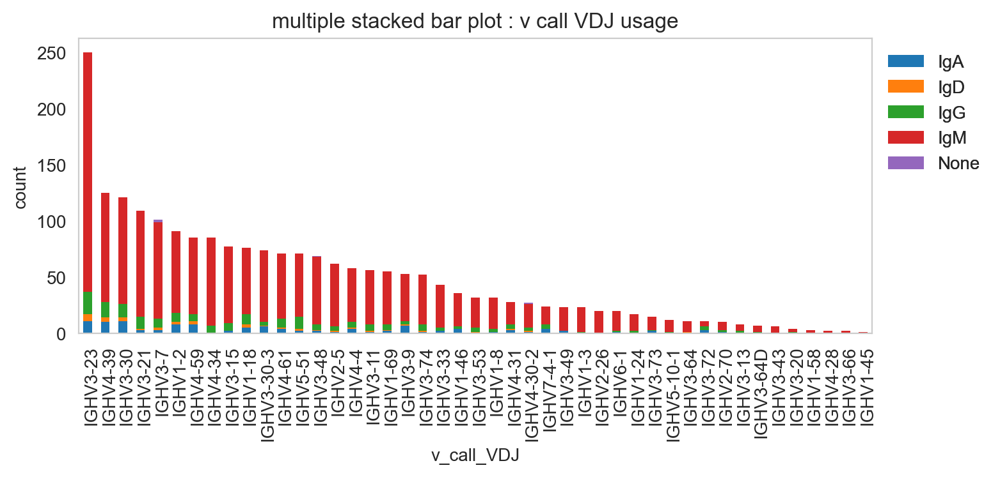

In [28]:
ddl.pl.stackedbarplot(
    vdj_subset,
    color="v_call_VDJ",
    group_by="isotype_status",
)
plt.legend(bbox_to_anchor=(1, 1), loc="upper left", frameon=False)
plt.show()

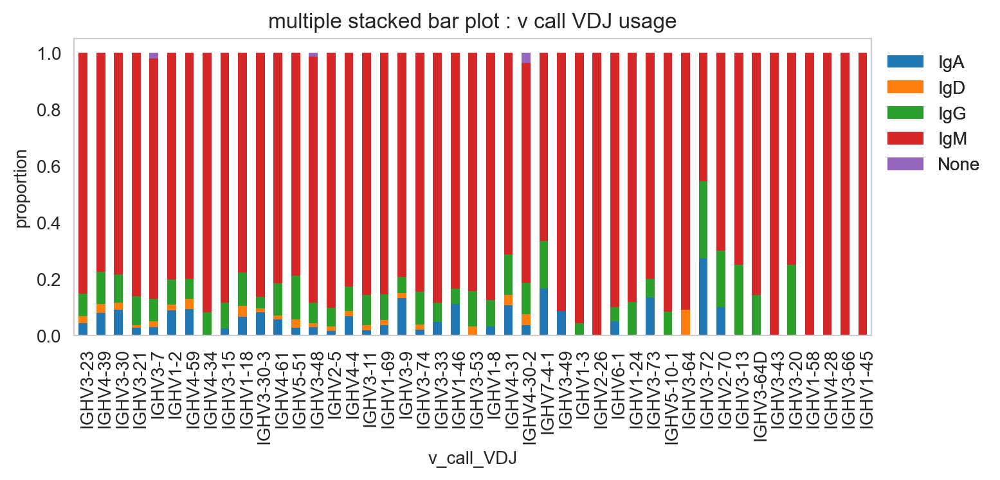

In [29]:
ddl.pl.stackedbarplot(
    vdj_subset,
    color="v_call_VDJ",
    group_by="isotype_status",
    normalize=True,
)
plt.legend(bbox_to_anchor=(1, 1), loc="upper left", frameon=False)
plt.show()

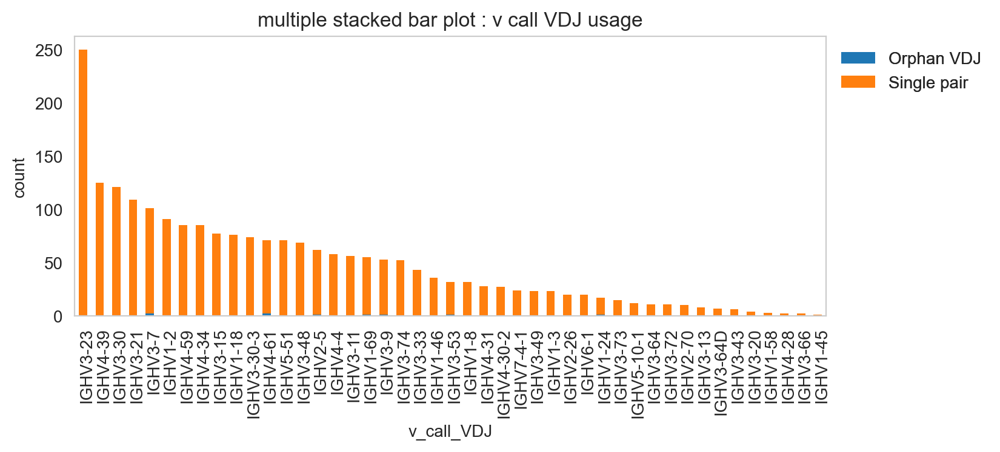

In [30]:
ddl.pl.stackedbarplot(
    vdj_subset,
    color="v_call_VDJ",
    group_by="chain_status",
)
plt.legend(bbox_to_anchor=(1, 1), loc="upper left", frameon=False)
plt.show()

It's obviously more useful if you don't have too many groups, but you could try and plot everything and jiggle the legend options and color.

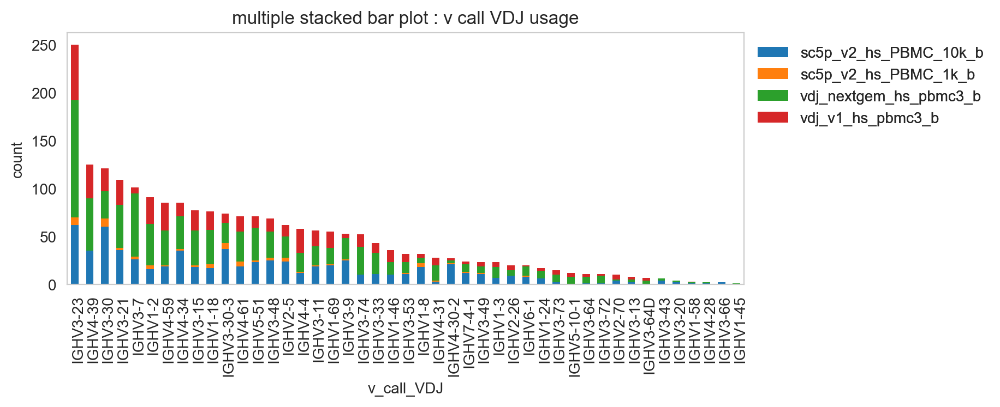

In [31]:
ddl.pl.stackedbarplot(
    vdj_subset,
    color="v_call_VDJ",
    group_by="sample_id",
)
plt.legend(bbox_to_anchor=(1, 1), loc="upper left", frameon=False)
plt.show()

### `ddl.pl.spectratype`
Spectratype plots contain info displaying CDR3 length distribution for specified groups. For this function, the current method only works for `Dandelion` and `DandelionPolars` objects as it requires access to the contig-indexed *.data* slot.

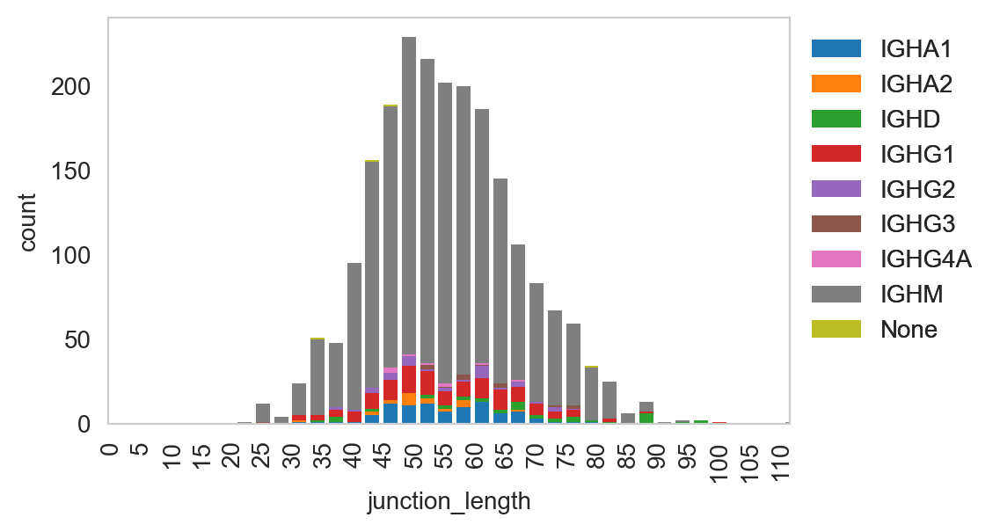

In [32]:
ddl.pl.spectratype(
    vdj_subset,
    color="junction_length",
    group_by="c_call",
    locus="IGH",
    width=2.3,
)
plt.legend(bbox_to_anchor=(1, 1), loc="upper left", frameon=False)
plt.show()

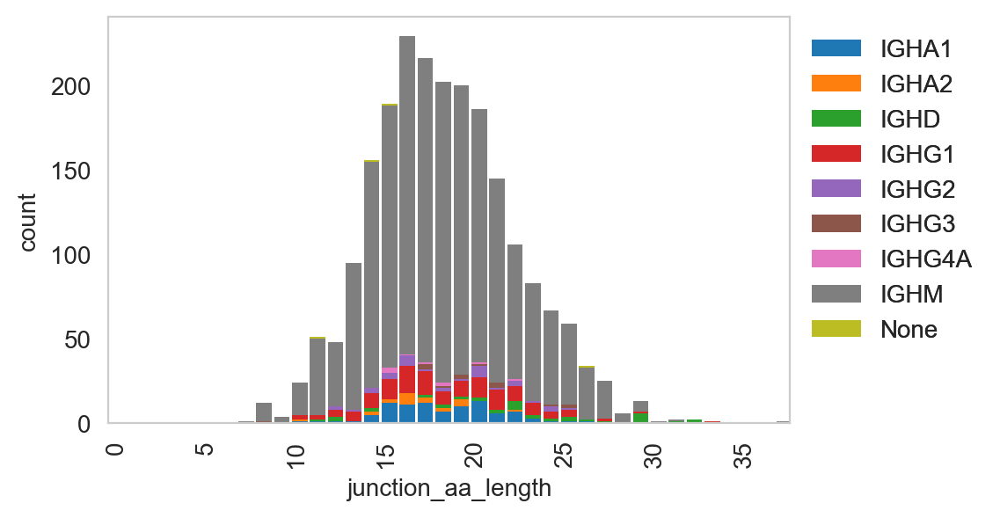

In [33]:
ddl.pl.spectratype(
    vdj_subset,
    color="junction_aa_length",
    group_by="c_call",
    locus="IGH",
)
plt.legend(bbox_to_anchor=(1, 1), loc="upper left", frameon=False)
plt.show()

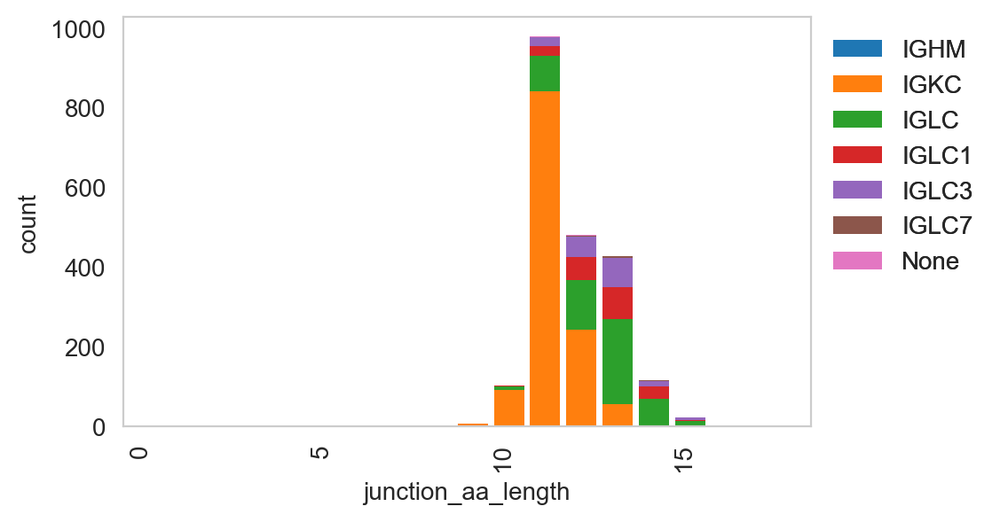

In [34]:
ddl.pl.spectratype(
    vdj_subset,
    color="junction_aa_length",
    group_by="c_call",
    locus=["IGK", "IGL"],
)
plt.legend(bbox_to_anchor=(1, 1), loc="upper left", frameon=False)
plt.show()

### `ddl.pl.clone_overlap`
There is now a circos-style clone overlap function where it looks for whether different samples share a clone. If they do, an arc/connection will be drawn between them.

In [35]:
ddl.tl.clone_overlap(adata, group_by="leiden")

Calculating clone overlap
 finished: Updated AnnData: 
   'uns', clone overlap table (0:00:00)


/opt/homebrew/Caskroom/miniforge/base/envs/dandelion/lib/python3.12/site-packages/nxviz/annotate.py:68: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


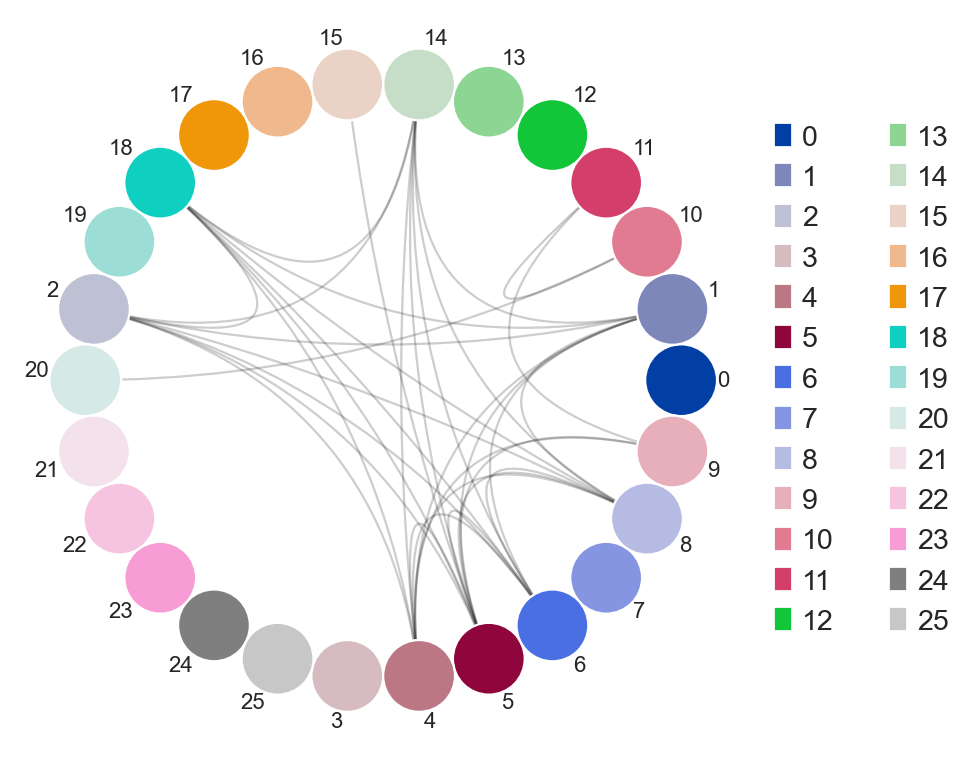

In [36]:
sc.set_figure_params(figsize=[6, 6])
ddl.pl.clone_overlap(adata, group_by="leiden")
plt.show()

Other use cases for this would be, for example, to plot nodes as individual samples and the colors as group classifications of the samples. As long as this information is found in the `.obs` column in the `AnnData`, or even `DandelionPolars.metadata`, this will work.

You an also specify `weighted_overlap = True` and the thickness of the edges will reflect the number of cells found to overlap between the nodes/samples.

Calculating clone overlap
 finished: Updated AnnData: 
   'uns', clone overlap table (0:00:00)


/opt/homebrew/Caskroom/miniforge/base/envs/dandelion/lib/python3.12/site-packages/nxviz/annotate.py:68: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


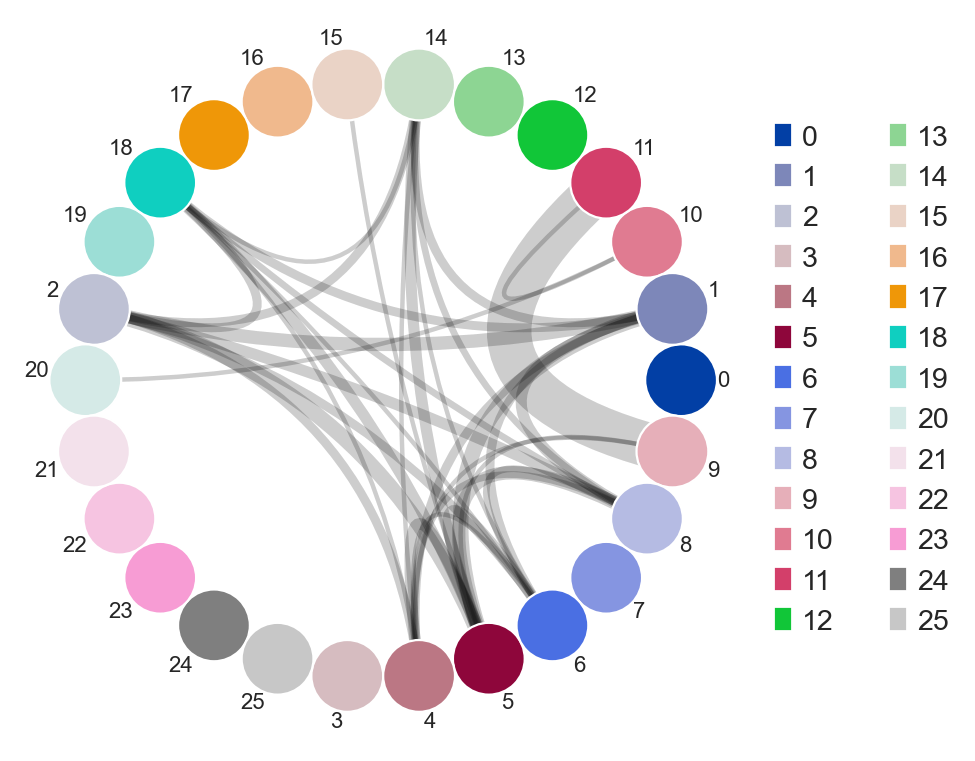

In [37]:
ddl.tl.clone_overlap(adata, group_by="leiden", weighted_overlap=True)
ddl.pl.clone_overlap(adata, group_by="leiden", weighted_overlap=True)
plt.show()

You can also visualise this as a heatmap by specifying `as_heatmap = True`.

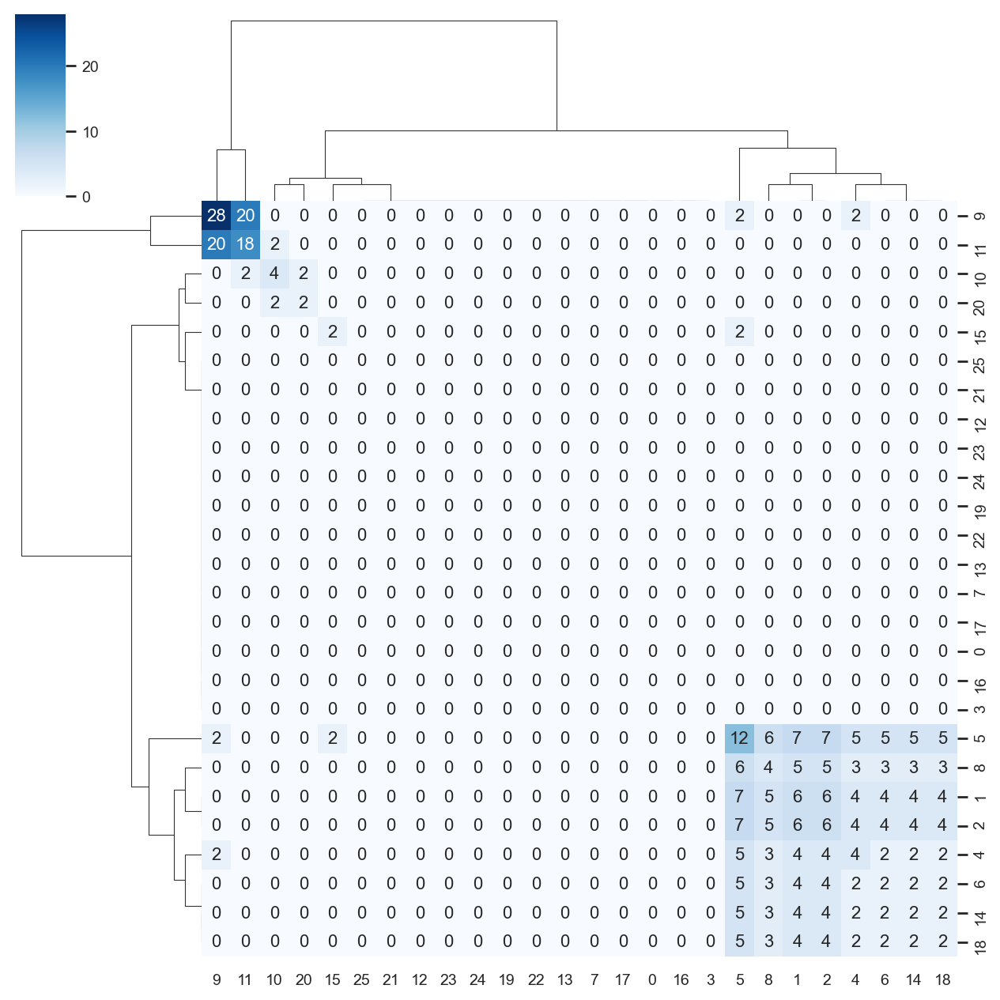

In [38]:
import seaborn as sns

sns.set(font_scale=0.8)

ddl.pl.clone_overlap(
    adata,
    group_by="leiden",
    weighted_overlap=True,
    as_heatmap=True,
    # seaborn clustermap kwargs
    cmap="Blues",
    annot=True,
    figsize=(8, 8),
    annot_kws={"size": 10},
    fmt="g",
)
plt.show()

### `tl.vj_usage_pca`

You can also compute the V/J gene usage in your various groups of interest. This function will return a new `AnnData` where instead of `cells` (obs) by `gene` (var), it will be `group_by` (obs) by `V/J genes` (var).

<div class="alert alert-warning">

Note

This function now requires a `DandelionPolars` object as the `vdj` argument.

</div>

For example, I'm interested if the leiden clusters within each donor's sample use V/J genes differently:

In [39]:
# first make a concatenated group
adata.obs["sample_id_leiden"] = [
    s + "_" + l for s, l in zip(adata.obs["sample_id"], adata.obs["leiden"])
]
new_adata = ddl.tl.vj_usage_pca(
    adata,
    vdj,
    group_by="sample_id_leiden",
    mode="B",  # because B cells, use abT and gdT for alpha-beta and gamma-delta T cells respectively
    transfer_mapping=[
        "sample_id",
        "leiden",
    ],  # this transfers the sample_id and leiden values separately. if not provided, only sample_id_leiden is transferred.
    n_comps=3,  # 3 because the example is small here. the default is set at 30
)
new_adata

Computing PCA for V/J gene usage
computing PCA
    with n_comps=3
    finished (0:00:00)
 finished: Returned AnnData: 
   'obsm', X_pca for V/J gene usage (0:00:00)


/opt/homebrew/Caskroom/miniforge/base/envs/dandelion/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None


AnnData object with n_obs × n_vars = 8 × 120
    obs: 'cell_type', 'cell_count', 'sample_id', 'leiden'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

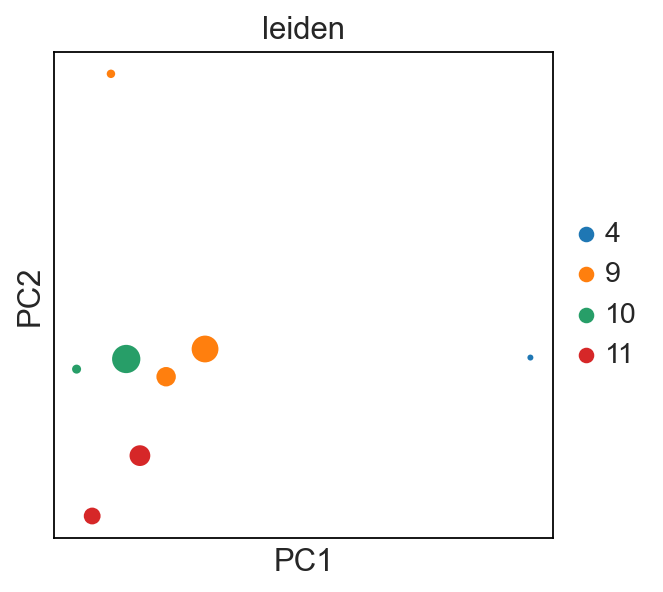

In [40]:
sc.set_figure_params()

sc.pl.pca(new_adata, color="leiden", size=new_adata.obs["cell_count"])
# each dot is a `sample_id_leiden`. Check the .obs

### `tl.productive_ratio`/`pl.productive_ratio`

This new function lets you quantify what is the distribution of productive versus non-productive contigs at a cell-level. To do this, we need to re-check the `DandelionPolars` object so that non-productive columns are not removed.

In [41]:
vdj2, adata2 = ddl.pp.check_contigs(vdj, adata, productive_only=False)

Filtering contigs...
Marking ambiguous contigs...
Initializing DandelionPolars object...
Transferring network
 finished: updated `.obs` with `.metadata`
 (0:00:00)


In [42]:
ddl.tl.productive_ratio(adata2, vdj2, group_by="leiden", locus="IGK")

Tabulating productive ratio
 finished: Updated AnnData: 
   'obs', 'IGK_productive'
   'uns', 'productive_ratio'
 (0:00:00)


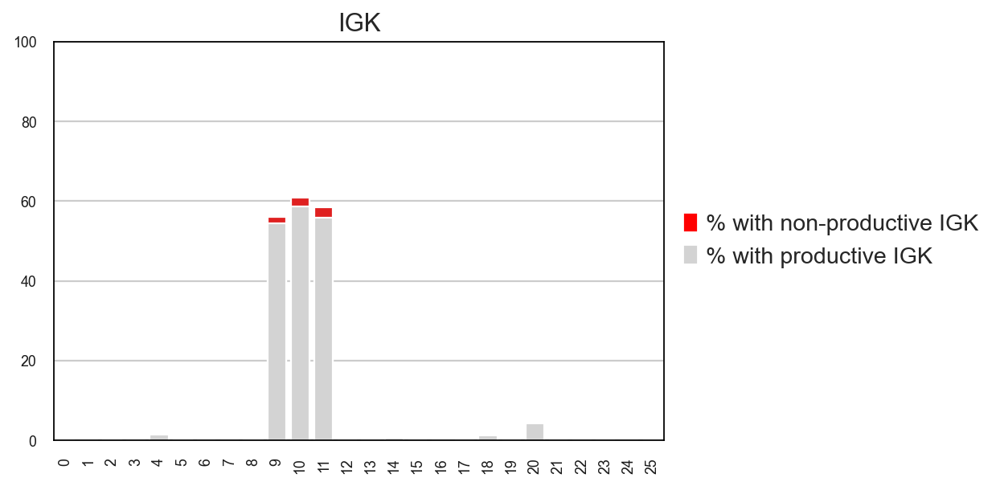

In [43]:
ddl.pl.productive_ratio(adata2, palette=["red", "lightgrey"])
plt.tight_layout()
# plt.savefig('plot.pdf')
plt.show()

### `pl.clone_circlepackplot`

`pl.clone_circlepackplot` is a bubble plot to visualise clone sizes within groups using circle packing. Each group (e.g. sample, celltype) is represented as an enclosing circle, with clones within that group shown as packed inner circles sized proportionally to clone size.

This function works with both `AnnData` and `DandelionPolars` objects. Singletons can be excluded by setting `min_clone_size=2`. We also enable `show_count_labels=True` to annotate each circle with its cell count.

In [44]:
vdj.metadata.collect()["clone_id_size"].value_counts().sort("clone_id_size")

clone_id_size,count
f64,u32
null,8
1.0,2197
2.0,102
3.0,30
16.0,16


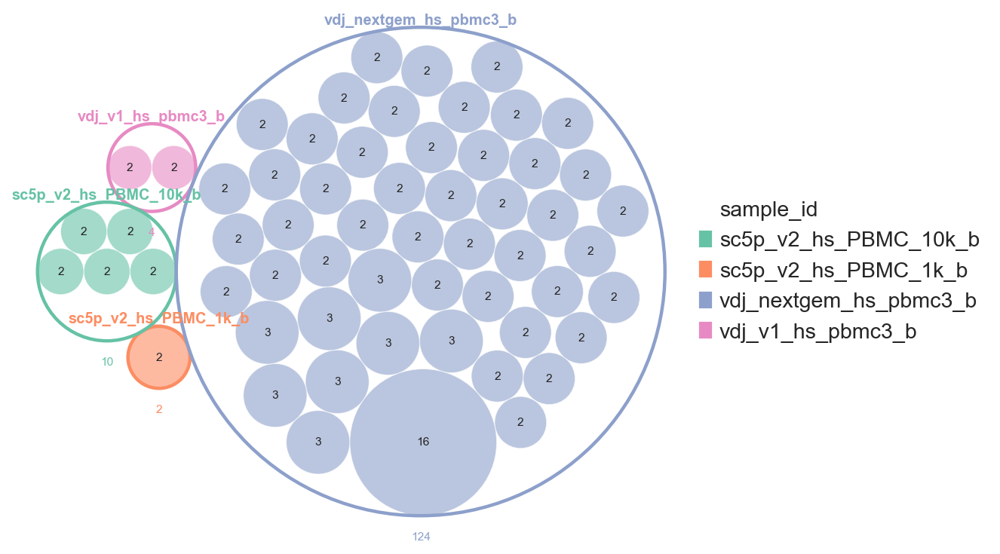

In [45]:
ddl.pl.clone_circlepackplot(
    vdj,
    group_by="sample_id",
    min_clone_size=2,
    show_count_labels=True,
    figsize=(7, 7),
)
plt.show()

Setting `as_subplots=True` splits the figure into one panel per top-level group. `scale_subplots=True` (the default) scales enclosing circles proportionally to total cell count, so a clone of a given size always occupies the same area across panels.

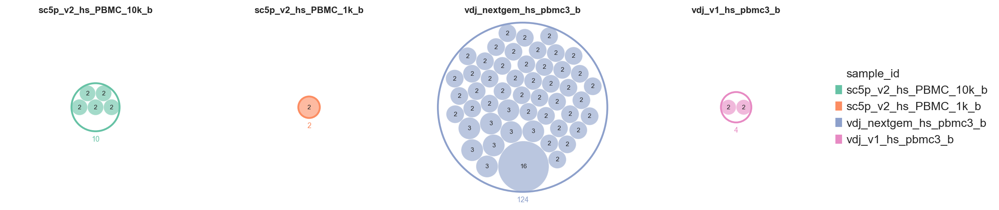

In [46]:
ddl.pl.clone_circlepackplot(
    vdj,
    group_by="sample_id",
    min_clone_size=2,
    as_subplots=True,
    show_count_labels=True,
    figsize=(4, 4),
)
plt.show()

Passing a list to `group_by` produces a multi-level nesting. The hierarchy follows the list order: the first element is the outermost ring, subsequent elements are nested rings, and clone circles sit at the innermost level. Each level is coloured independently using its own colour map.

min to max ratio is too low at 0.0 and it could cause algorithm stability issues. Try to remove insignificant data
min to max ratio is too low at 0.0 and it could cause algorithm stability issues. Try to remove insignificant data


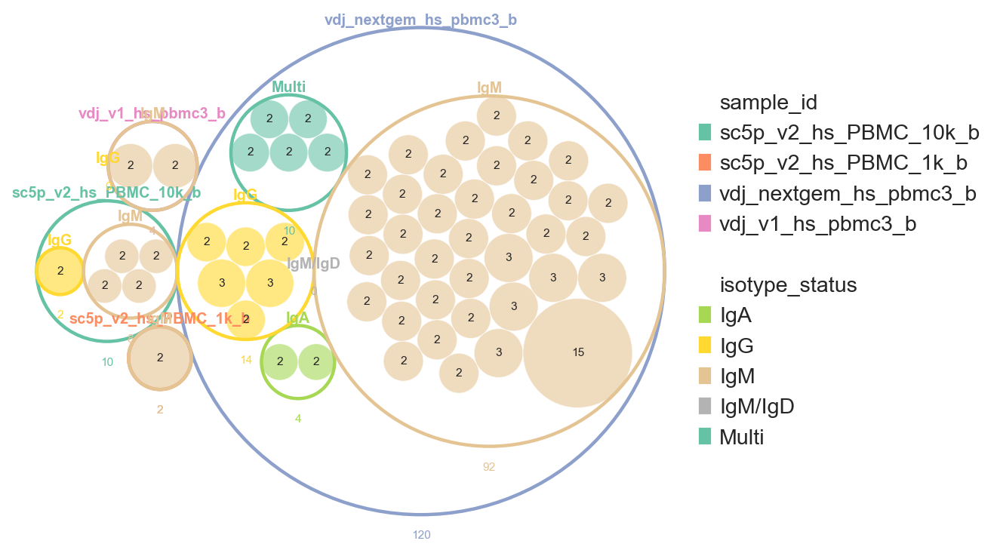

In [47]:
ddl.pl.clone_circlepackplot(
    vdj,
    group_by=["sample_id", "isotype_status"],
    min_clone_size=2,
    show_count_labels=True,
    figsize=(7, 7),
)
plt.show()

### Using different distance metrics in `find_clones`

By default, `find_clones` uses `hamming distance` as the distance metric, which only accounts for substitutions. If you want to account for insertions and deletions as well, you can change the distance metric to `levenshtein` or even `BLOSUM62`. You can also provide your own custom distance as a lambda function if you have specific requirements for how you want to define the distance between sequences. We will show you how to do this here:

In [48]:
# let's reset vdj object to be lazy polars version
vdj.to_polars()

Finding clonotypes


Finding clones based on B cell VDJ chains using junction_aa: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]
Finding clones based on B cell VJ chains using junction_aa: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


Storing distance matrix...


Building distance matrix (batched): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

Stored distances as CSR sparse matrix: (2353, 2353), density=99.32%
 finished: Updated Dandelion object: 
   'data', contig AIRR table
   'metadata', cell observations table
   'distances', sparse distance matrix
 (0:00:01)
Generating network
Using pre-computed distances from .distances

Computing network layout


Computing expanded network layout
 finished.
   Updated Dandelion object
:    'layout', graph layout
 (0:00:00)
Transferring network
 finished: updated `.obs` with `.metadata`
wrote active layout to `.obsm['X_vdj']`; stashed all views in `.uns['dandelion']` ('X_vdj_all', 'X_vdj_expanded')
wrote `.obsp['connectivities']` & `['distances']` from graph[0]
stashed GEX matrices in `.uns['dandelion']` ('gex_connectivities', 'gex_distances')
stashed VDJ matrices in `.uns['dandelion']` under 'vdj_connectivities_all' / '_expanded'
added `.uns['clone_id']` clone-level mapping (0:00:00)


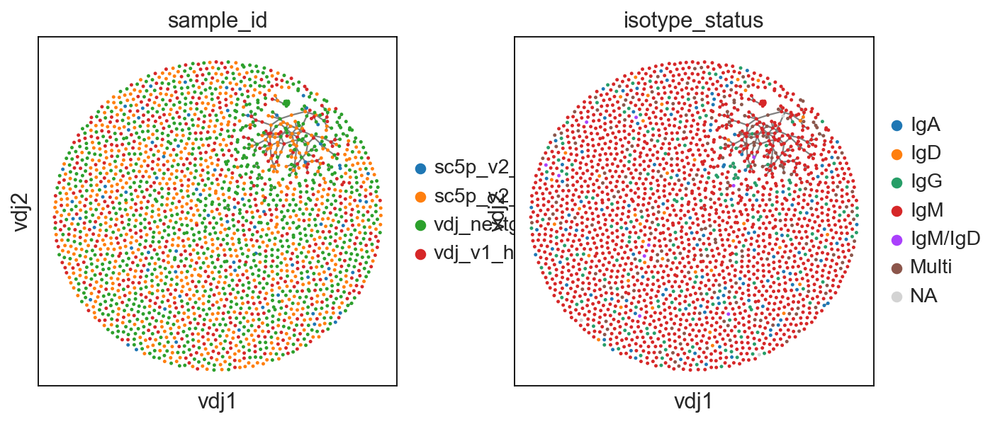

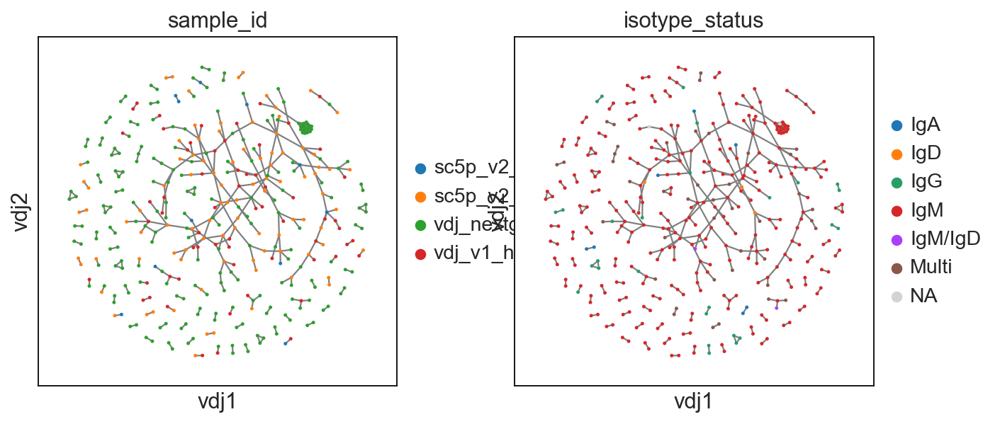

In [49]:
# --- Levenshtein ---
vdj2 = vdj.copy()
adata2 = adata.copy()

ddl.tl.find_clones(
    vdj2, dist_func="levenshtein", same_vj=False, same_length=False
)
ddl.tl.generate_network(vdj2, use_existing_graph=False)
ddl.tl.transfer(adata2, vdj2)

ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)
ddl.tl.clone_view(adata2, mode="expanded")
ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)

Finding clonotypes


Finding clones based on B cell VDJ chains using junction_aa: 100%|██████████| 27/27 [00:00<00:00, 316.30it/s]
Finding clones based on B cell VJ chains using junction_aa: 100%|██████████| 14/14 [00:00<00:00, 132.14it/s]


Storing distance matrix...


Building distance matrix (batched): 100%|██████████| 1/1 [00:00<00:00, 13.87it/s]

Stored distances as CSR sparse matrix: (2353, 2353), density=36.43%
 finished: Updated Dandelion object: 
   'data', contig AIRR table
   'metadata', cell observations table
   'distances', sparse distance matrix
 (0:00:00)
Generating network
Using pre-computed distances from .distances

Computing network layout


Computing expanded network layout
 finished.
   Updated Dandelion object
:    'layout', graph layout
 (0:00:00)
Transferring network
 finished: updated `.obs` with `.metadata`
wrote active layout to `.obsm['X_vdj']`; stashed all views in `.uns['dandelion']` ('X_vdj_all', 'X_vdj_expanded')
wrote `.obsp['connectivities']` & `['distances']` from graph[0]
stashed GEX matrices in `.uns['dandelion']` ('gex_connectivities', 'gex_distances')
stashed VDJ matrices in `.uns['dandelion']` under 'vdj_connectivities_all' / '_expanded'
added `.uns['clone_id']` clone-level mapping (0:00:00)


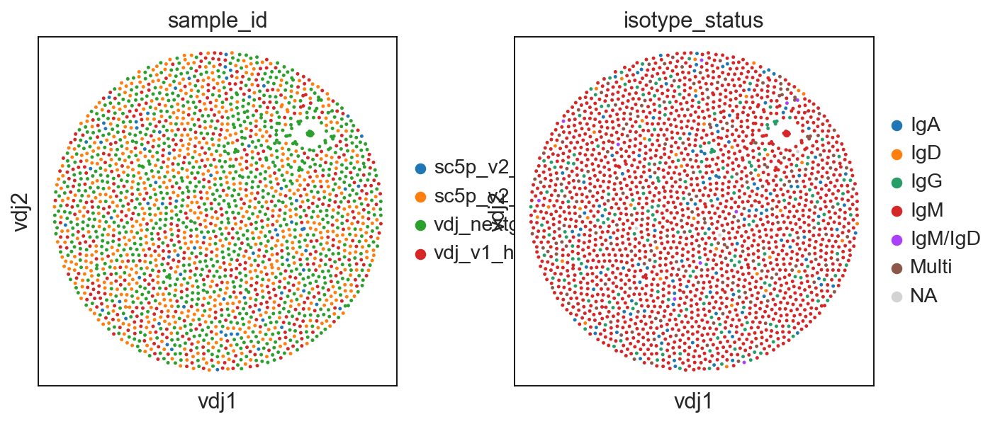

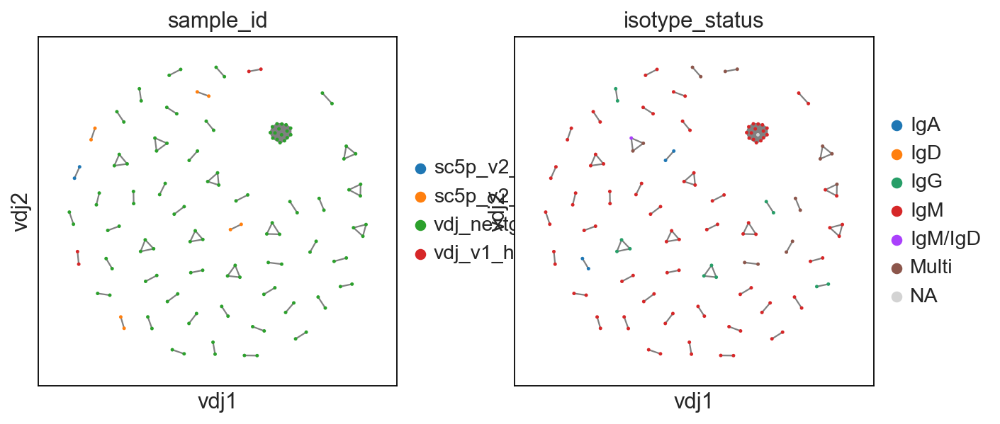

In [50]:
# --- BLOSUM62 ---
# I'm not sure if this is working as intended because the resulting network looks very similar to the hamming distance one, but here is how you would do it:
vdj2 = vdj.copy()
adata2 = adata.copy()

ddl.tl.find_clones(vdj2, dist_func="blosum62", same_vj=False)
ddl.tl.generate_network(vdj2, use_existing_graph=False)
ddl.tl.transfer(adata2, vdj2)

ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)
ddl.tl.clone_view(adata2, mode="expanded")
ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)

Finding clonotypes


Finding clones based on B cell VDJ chains using junction_aa: 100%|██████████| 1177/1177 [00:00<00:00, 15673.89it/s]
Finding clones based on B cell VJ chains using junction_aa: 100%|██████████| 485/485 [00:00<00:00, 11796.44it/s]


Storing distance matrix...


Building distance matrix (batched): 100%|██████████| 17/17 [00:00<00:00, 3684.54it/s]

Stored distances as CSR sparse matrix: (2353, 2353), density=0.72%
 finished: Updated Dandelion object: 
   'data', contig AIRR table
   'metadata', cell observations table
   'distances', sparse distance matrix
 (0:00:00)
Generating network


Using pre-computed distances from .distances

Computing network layout
Computing expanded network layout
 finished.
   Updated Dandelion object
:    'layout', graph layout
 (0:00:00)
Transferring network
 finished: updated `.obs` with `.metadata`
wrote active layout to `.obsm['X_vdj']`; stashed all views in `.uns['dandelion']` ('X_vdj_all', 'X_vdj_expanded')
wrote `.obsp['connectivities']` & `['distances']` from graph[0]
stashed GEX matrices in `.uns['dandelion']` ('gex_connectivities', 'gex_distances')
stashed VDJ matrices in `.uns['dandelion']` under 'vdj_connectivities_all' / '_expanded'
added `.uns['clone_id']` clone-level mapping (0:00:00)


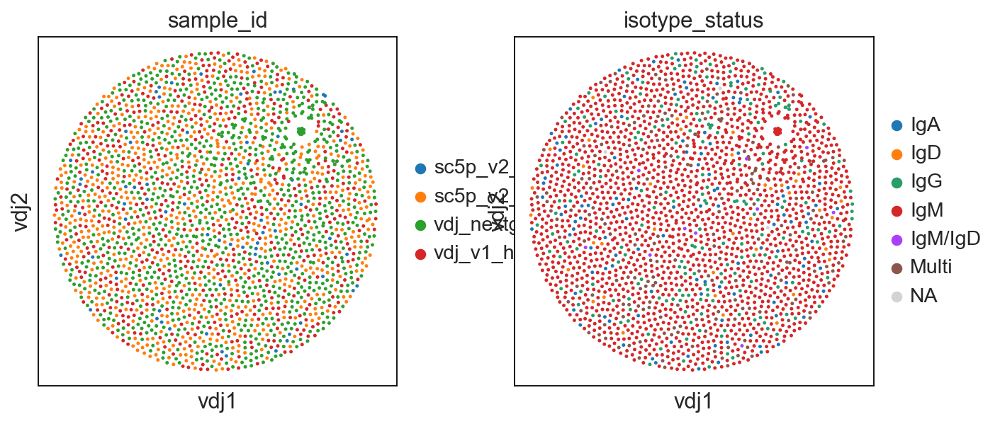

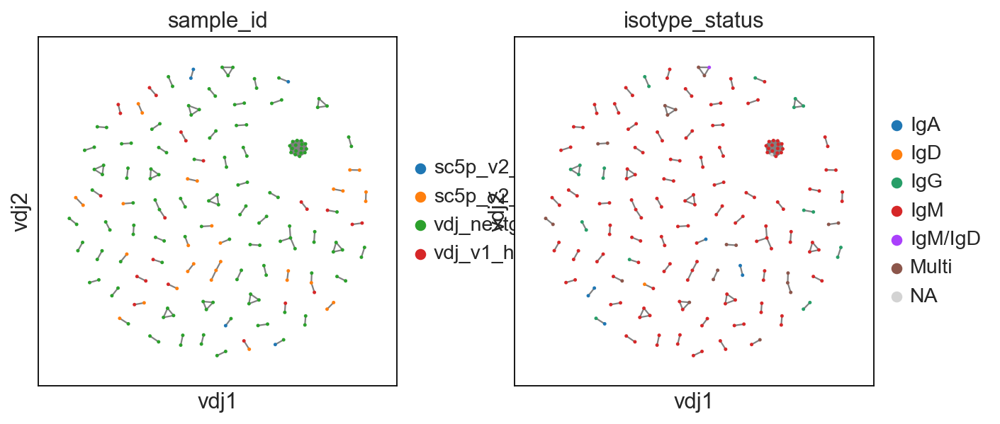

In [51]:
# --- Custom lambda function ---
vdj2 = vdj.copy()
adata2 = adata.copy()

ddl.tl.find_clones(
    vdj2, dist_func=lambda x, y: 0 if x == y else 1
)  # this is basically a simple identity metric but with a custom function. You can make it as complex as you want as long as it takes in two sequences and outputs a distance metric.
ddl.tl.generate_network(vdj2, use_existing_graph=False)
ddl.tl.transfer(adata2, vdj2)

ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)
ddl.tl.clone_view(adata2, mode="expanded")
ddl.pl.clone_network(
    adata2, color=["sample_id", "isotype_status"], edges_width=1, size=20
)